#  Анализ рынка заведений общественного питания Москвы

## Введение
<b> Краткое описание проекта: </b>

<b> Цель проекта: </b> Провести исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

<b> Описание данных: </b>

Датасет с заведениями общественного питания Москвы, составлен на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

`name` — название заведения;

`address` — адрес заведения;

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
- «Средний счёт: 1000–1500 ₽»;
- «Цена чашки капучино: 130–220 ₽»;
- «Цена бокала пива: 400–600 ₽». и так далее;

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.


<b>План работы: </b> <a id="cell0"></a>

[<b>1. Загрузить данные и изучить общую информацию</b>](#cell1)

    
[<b>2. Выполнить предобработку данных.</b>](#cell2)

- Проверить наличие дубликатов, пропусков в данных и обработать их при возможности.

- Создать дополнительные столбцы, необходимые для дальнейшей работы.
    
[<b>3. Анализ данных и визуализация.</b>](#cell3)

- Проанализировать категории заведений, их характеристики. 

- Определить топ-15 популярных сетей в Москве (по количеству заведений).

- Определить распределение заведений по административным районам Москвы.

- Отобразить заведения на карте.

- Определить топ-15 улиц по количеству заведений.

- Проанализировать информацию об улицах, на которых расположено только 1 заведение.

- Проанализировать средний размер чека по районам.

[<b>4. Детализация исследования в части оценки возможности открытия кофейни. </b>](#cell4)

- Проанализировать имеющуюся информацию о кофейнях.

- Сформулировать рекомендации для открытия нового заведения.

[<b>5. Подготовить презентацию исследования для инвесторов </b>](#cell5)


### 1. Загрузка данных и изучение общей информации <a id="cell1"></a> <font size = 2>[к оглавлению](#cell0)</font>

Импорт необходимых библиотек

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
import plotly.express as px
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from functools import reduce
from plotly import graph_objects as go

Загрузка файла

In [2]:
data = pd.read_csv('moscow_places.csv')

Просмотр данных, вывод первых 5 строк датафрейма

In [3]:
data.head() 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Основная информацию о датафрейме

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод по загрузке и первичному анализу данных:**
В датафрейм собрана информация о 8406 заведениях питания Москвы.  Типы данных в целом соответсвуют хранимому содержимому, тип float для `seats`(количество посадочных мест) приемлем для дальнейшего анализа, не будем его менять.


### 2. Предобработка данных <a id="cell2"></a> <font size = 2>[к оглавлению](#cell0)</font>

Имеются пропуски в столбцах:

- `hours`(часы работы заведения),
- `price`(категория цен в заведении),
- `avg_bill`(диапазон среднего чека),
- `middle_avg_bill`(число с оценкой среднего чека)
- `middle_coffee_cup`(число с оценкой одной чашки капучино)
- `seats`(количество посадочных мест)

Заполнить корректно пропущенные значения не представляется возможным, а так как пропуски занимают существенный объем данных, оставим их неизменными.



Пред проверкой на дубликаты обработаем поля названия и адреса, чтобы исключить случаи различных написаний, приведем к нижнему регистру, удалим возможные пробелы и заменим ё на е. Логично предположить, что сочетание названия и адреса может быть индикатором дубликатов.

In [5]:
for i in ['name','address']:
    data[i] = data[i].str.lower() # приведение к нижнему регистру
    data[i] = data[i].str.strip() # удаление пробелов
    data[i] = data[i].str.replace('ё', 'е') # замена е на ё

In [6]:
print('Количество явных дубликатов:', data.duplicated().sum())
print('Количество дубликатов по названию заведения и адресу:',data[['name', 'address']].duplicated().sum())

Количество явных дубликатов: 0
Количество дубликатов по названию заведения и адресу: 4


Удалим найденные дубликаты

In [7]:
data = data.drop_duplicates(subset=['name', 'address'], keep='first')
print('Количество дубликатов по названию заведения и адресу:',data[['name', 'address']].duplicated().sum())

Количество дубликатов по названию заведения и адресу: 0


Добавим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

 - логическое значение True — если заведение работает ежедневно и круглосуточно; 
 - логическое значение False — в противоположном случае.

In [8]:
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')

Выделим улицу из адреса в отдельный столбец

In [9]:
data['street'] = data['address'].str.split(', ', expand=True)[1]

Для дальнейшей работы заменим идентификацию сетевых/несететвых заведений

In [10]:
data['chain'] = data['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN,False,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,False,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,False,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,False,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,False,правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,несетевое,86.0,False,профсоюзная улица
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,несетевое,150.0,False,пролетарский проспект
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,несетевое,150.0,True,люблинская улица
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,сетевое,150.0,True,люблинская улица


Проверим, попадаются ли одни и те же объекты заведений в разных категориях

In [11]:
data['category'].unique()# находим уникальные категории заведений

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [12]:
len(reduce(np.intersect1d, (data.query('category == "кафе"')['name'].unique(),\
                   data.query('category == "ресторан"')['name'].unique(), \
                   data.query('category == "кофейня"')['name'].unique(), \
                   data.query('category == "пиццерия"')['name'].unique(), \
                   data.query('category == "бар,паб"')['name'].unique(), \
                   data.query('category == "быстрое питание"')['name'].unique(), \
                   data.query('category == "булочная"')['name'].unique(), \
                   data.query('category == "столовая"')['name'].unique())))

0

Пересечений нет, каждое заведение попадает только в одну категорию

**Вывод по предобработке данных:** 
- Имеются пропуски, касающиеся детальной информации о заведении, такой как ценовая оценка (категория цен, оценка среднего чека, оценка стоимости чашки капучино) и характеристик заведения (часы и количество посадочных мест). Пропуски можно объяснить тем, что данная инфомрация может меняться с течением времени и ее трудно держать в актуальном состоянии. Корректно обработать большое количество пропусков не представляется возможным, поэтому данные оставлены без изменений.
- Данные были обработаны: чтобы исключить случаи различных написаний поля названия и адреса приведены к нижнему регистру, удалены возможные пробелы и заменены ё на е.
- Явных дубликатов обнаружено не было, дубликата по названию и адресу (4 шт.) были удалены. 
- Добавлены столбцы: 
    - с выделеным названием улицы, 
    - с обозначением, что заведение работает ежедневно и круглосуточно (24/7), 
    - а таже для удобства восприятия переведена в тектовую информация об отнесении заведения к сетевому\несетеовму. 
- Проверка на попадание одних и тех же заведений прошла успешно: каждое заведение представлено только в 1 категории.


### 3. Анализ данных <a id="cell3"></a> <font size = 2>[к оглавлению](#cell0)</font>

Посмотрим, как распределяются объекты общественного питания по категориям

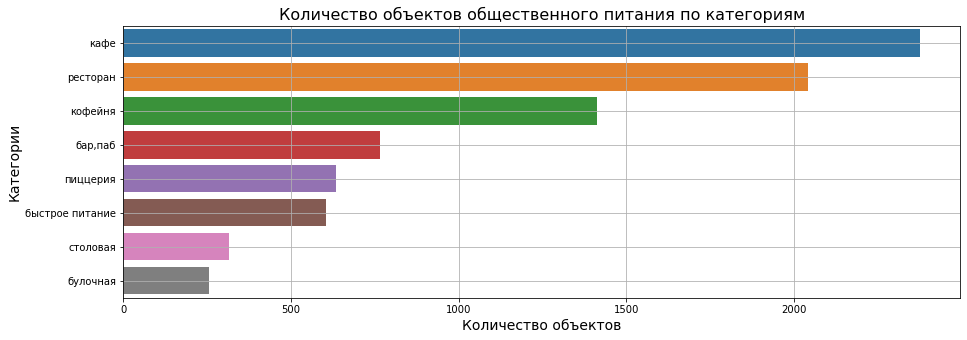

In [13]:
plt.figure(figsize=(15, 5)) # задаем размер фигуры
sns.countplot(y=data["category"], order=data["category"].value_counts().index)
plt.title('Количество объектов общественного питания по категориям', size = 16)
plt.xlabel('Количество объектов', size = 14)
plt.ylabel('Категории', size = 14)
plt.grid()
plt.show()

**Наибольшее количество объектов относятся к категориям кафе и рестораны, за ними идут кофейни. По оставшимся категориям количество объектов в разы ниже. Меньше всего столовых и булочных.**

Исследуем количество посадочных мест по категориям:

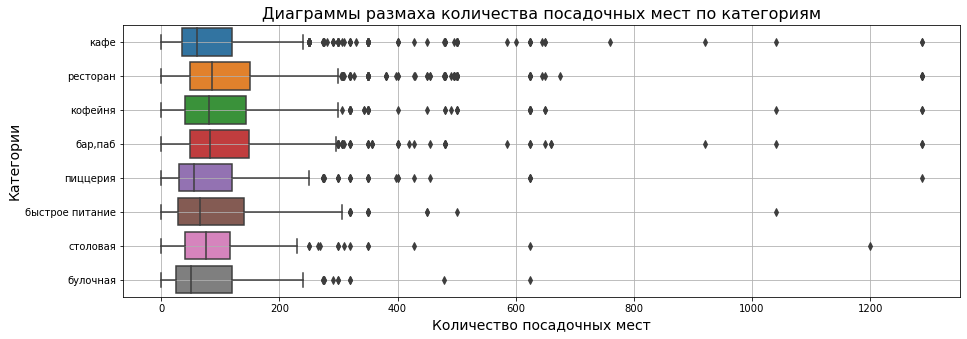

In [14]:
# построим график boxplot, посмотрим на выбросы в количестве посадочных мест
plt.figure(figsize=(15, 5)) # задаем размер фигуры
sns.boxplot(data=data, x = 'seats', y='category', order=data['category'].value_counts().index)
plt.title('Диаграммы размаха количества посадочных мест по категориям', size = 16)
plt.ylabel('Категории', size = 14)
plt.xlabel('Количество посадочных мест', size = 14)
plt.grid()
plt.show()

**В данных имеются значительные выбросы, сомнительно наличие в заведениях питания более 1000 посадочных мест. Построим график без выбросов, чтобы более детально проанализировать количество мест по заведениям.**

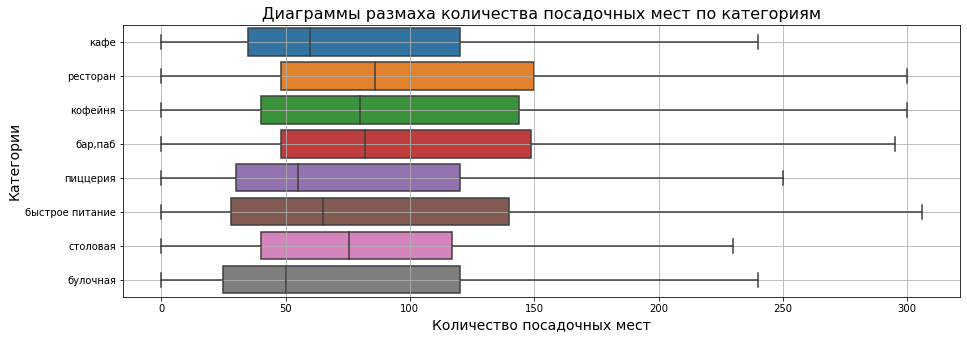

In [15]:
# используем параметр showfliers=False, чтобы убрать выбросы с графика
plt.figure(figsize=(15, 5)) # задаем размер фигуры
ax = sns.boxplot(x='seats', y='category', data=data,\
                 order=data['category'].value_counts().index,\
                 showfliers=False) 
plt.title('Диаграммы размаха количества посадочных мест по категориям', size = 16)
plt.ylabel('Категории', size = 14)
plt.xlabel('Количество посадочных мест', size = 14)
plt.grid()
plt.show()

**Учитывая наличие значительных выбросов целесообразно оценивать количество посадочных мест по медианному значению.**

Посмотрим, как количество посадочных мест распределяется по заведениям внутри каждой категории

In [16]:
 # создадим функцию categ() с параметром tip для визуализации данных, где tip-наименование категории заведения 
def categ(tip):
    data[data['category'] == tip]['seats'].hist(bins = 50,  figsize =(15, 4), grid = True)
    plt.title(tip, size = 20)
    plt.ylabel('Количество заведений', size = 16)
    plt.xlabel('Количество посадочных мест', size = 16)
    plt.show()
    return

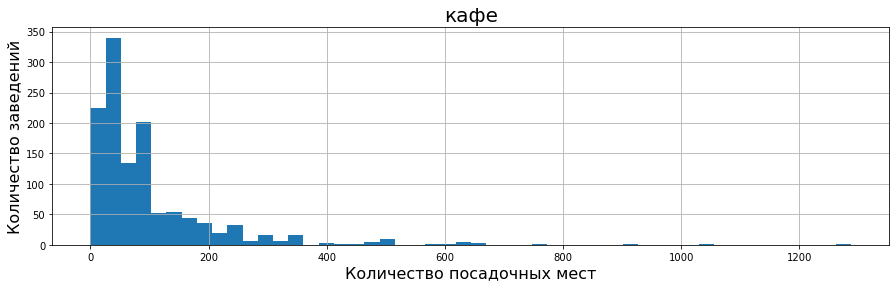

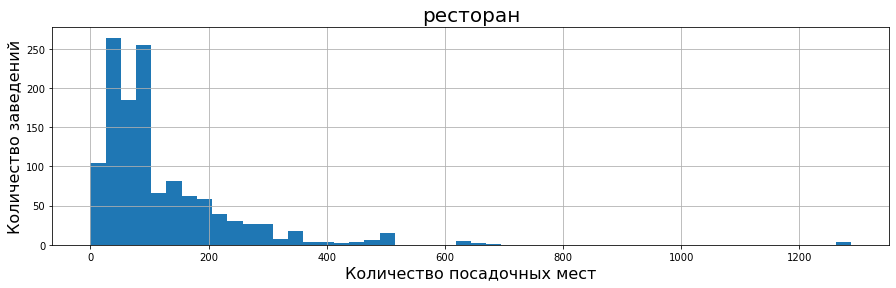

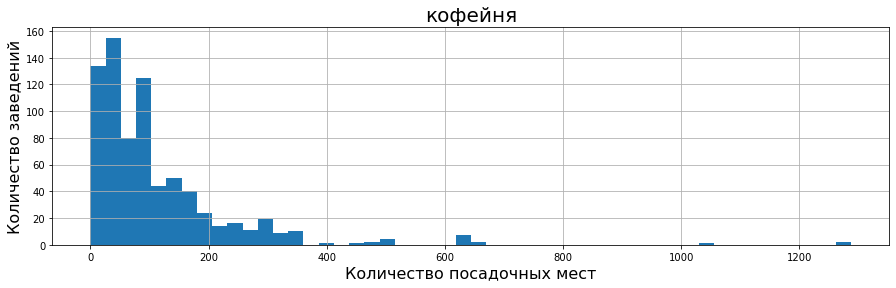

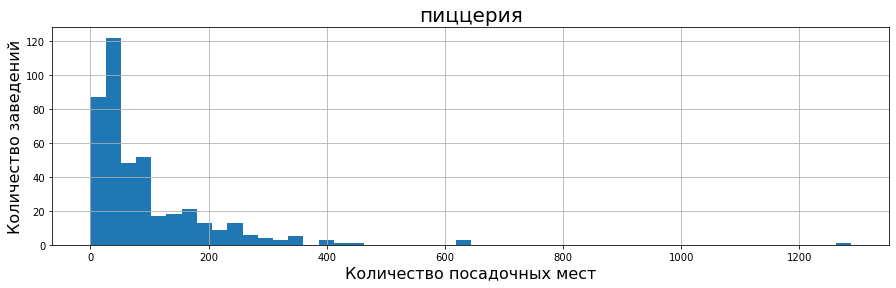

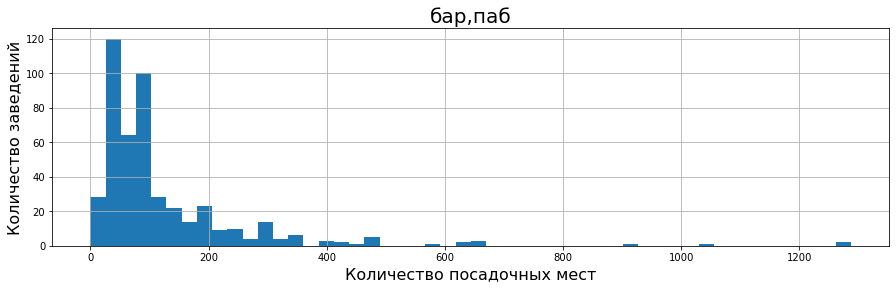

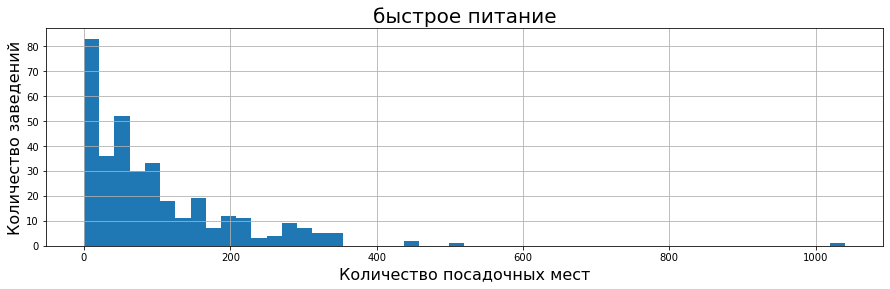

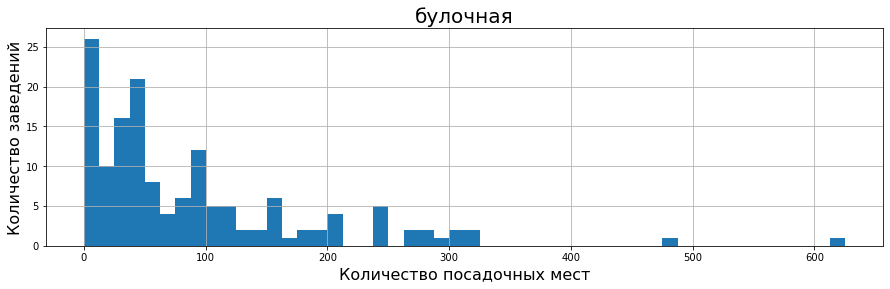

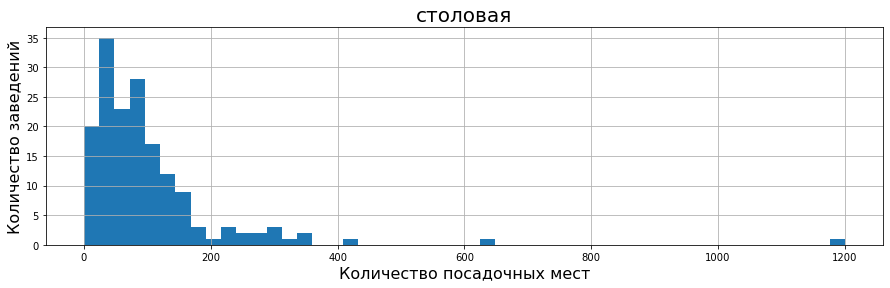

In [17]:
for tip in data['category'].unique(): # применим цикл для построения графиков по категориям
    categ(tip)    

**По каждой категории большинство заведений имеют менее 100 посадочных мест.**

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

In [18]:
# создадим датафрейм, где посчитаем количество сетевых и несетевых заведений
data_chain = pd.DataFrame(data['chain'].value_counts()).reset_index()
data_chain

,index,chain
0,несетевое,5199
1,сетевое,3203


In [19]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=data_chain['index'], # указываем значения, которые появятся на метках сегментов
                             values=data_chain['chain'] # указываем данные, которые отобразятся на графике
                             )]) 
fig.update_layout(title='Доли сетевых и несетевых заведений')
fig.show() 

**Доля сетевых заведений (38%) значительно меньше, чем несетевых (62%).**

Посмотрим как распределяются объекты сетевых и несетевых заведений по категориям

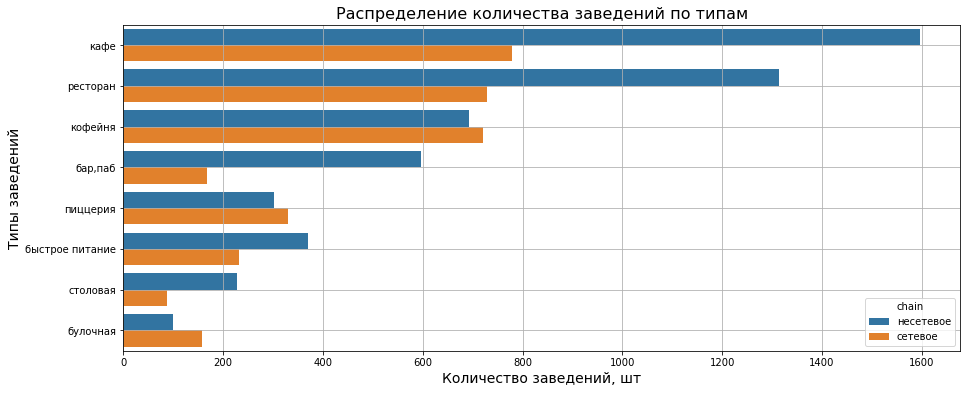

In [20]:
plt.figure(figsize=(15, 6)) # задаем размер фигуры
ax = sns.countplot(y=data['category'], order=data['category'].value_counts().index, hue = data['chain'])
ax.set_title('Распределение количества заведений по типам', size = 16)
plt.ylabel('Типы заведений', size = 14)
plt.xlabel('Количество заведений, шт', size = 14)
plt.grid()
plt.show()

**В разрезе типов заведений можно увидеть, что количество несетевых кафе, ресторанов, баров(пабов), заведений быстрого питания и столовых значительно больше, чем сетевых. Количество сетевых кофеен и пиццерий сопоставимо с количеством несетевых заведений аналогичных типов. Единственным сегментом, где сетевых предприятий больше являются булочные.**

Сгруппируем данные по названиям заведений и найдем топ-15 популярных (по количеству заведений) сетей в Москве. 

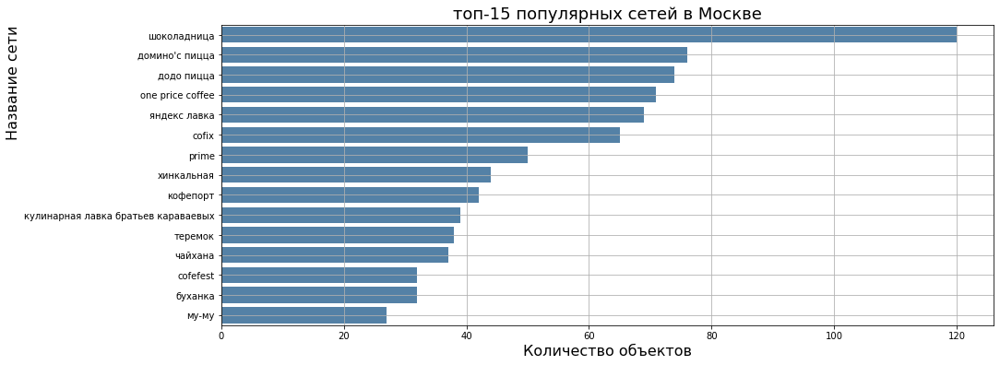

In [21]:
# Сделаем группировку названий по сетевым завадениям
data_chain = data.query('chain =="сетевое"').groupby('name', as_index = False)[['category']]\
                 .count()\
                 .sort_values(by = ['category'], ascending = False)
plt.figure(figsize=(15, 6))# задаем размер фигуры 
sns.barplot(x='category', y='name', data=data_chain.head(15), color= 'steelblue')
plt.title('топ-15 популярных сетей в Москве', size = 18)
plt.xlabel('Количество объектов', size = 16)
plt.ylabel('Название сети', size = 16, loc='top')
plt.grid()
plt.show()

**Лидером среди популярных сетей Москвы является шоколадница (заведение по продаже кофе и десертов к нему) и пиццерии. Далее снова идут кофейни.**

Определим какие административные районы Москвы присутствуют в датасете, а также отобразим общее количество заведений и количество заведений каждой категории по районам.

In [22]:
# Создадим датафрейм, сделаем сводную таблицу по районам Москвы, где посчитаем количество заведений по каждой категории
data_district=data.pivot_table(
        index='district',
        columns ='category',
        values='name',
        aggfunc='count',
        )
data_district['total'] = data_district.sum(axis=1) # Создадим столбец с суммарным количеством заведений для сортировки значений 
data_district.sort_values(by='total', ascending = False) # отсортируем районы по общему количеству заведений по убыванию

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Северный административный округ,68,39,58,234,193,77,188,41,898
Южный административный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Западный административный округ,50,37,62,238,150,71,218,24,850
Восточный административный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


In [23]:
# изменим вид сводной таблицы специально для построения графика, будем группировать по категории и по району 
# и считать количество заведений в каждой категории
data_district=data.pivot_table(
        index=['district','category'],
        values='name',
        aggfunc='count',
        ).reset_index()

fig = px.bar(data_district, x = 'district', y = 'name', color = 'category')
fig.update_layout(title ='Количество объектов каждой категории по округам',\
                  yaxis_title = 'Количество объектов', xaxis_title ='Название округа')
fig.update_xaxes(categoryarray= ['Центральный административный округ',\
                                 'Северный административный округ',\
                                 'Южный административный округ',\
                                 'Северо-Восточный административный округ',\
                                 'Западный административный округ',\
                                 'Восточный административный округ',\
                                 'Юго-Восточный административный округ',\
                                 'Юго-Западный административный округ',\
                                 'Северо-Западный административный округ'])
fig.show()

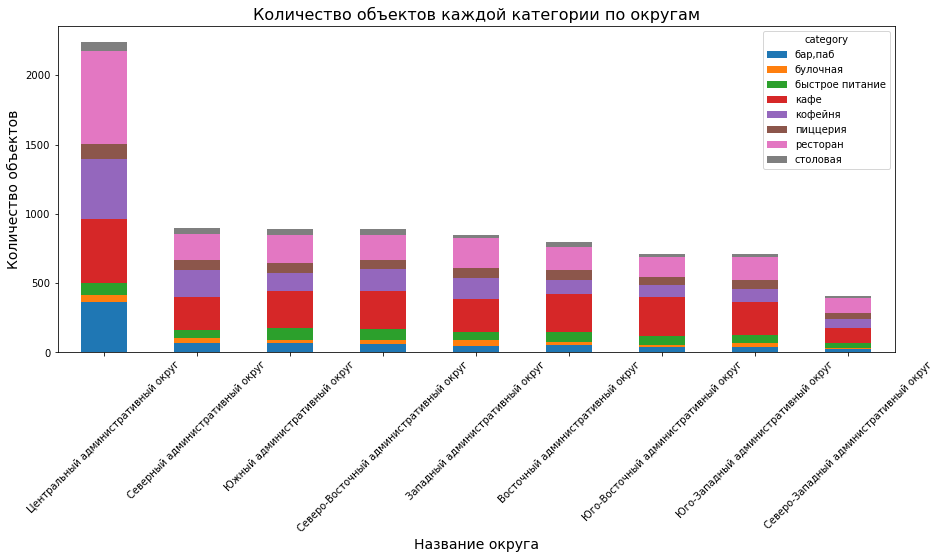

In [24]:
# Создадим сводную таблицу с группировкой по округам и выделением категорий
data_district=data.pivot_table(
        index='district',
        columns ='category',
        values='name',
        aggfunc='count',
        )
data_district['total'] = data_district.sum(axis=1) # Создадим столбец с суммарным количеством заведений для сортировки значений 
# Сортируем по общему количеству по убыванию
# Удаляем столбец с общим количеством, т.к. для построения графика он не нужен
data_district.sort_values(by='total', ascending = False)\
            .drop('total', axis=1)\
            .plot(kind = 'bar', stacked = True, figsize=(15, 6))

plt.title('Количество объектов каждой категории по округам', size = 16)
plt.ylabel('Количество объектов', size = 14)
plt.xlabel('Название округа', size = 14)
plt.xticks(rotation=45)
# отображаем график на экране
plt.show()

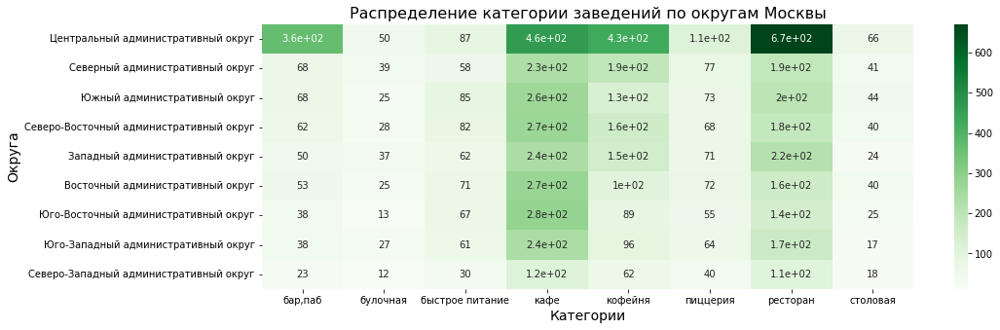

In [25]:
# Построим heatmap, посмотрим как распределяются количество заведений по округам Москвы
f, ax = plt.subplots(figsize=(15, 5))
sns.heatmap(data_district.sort_values(by='total', ascending = False).drop('total', axis=1), cmap="Greens", annot=True)
plt.title('Распределение категории заведений по округам Москвы', size = 16)
plt.xlabel('Категории', size = 14)
plt.ylabel('Округа', size = 14)
plt.show()

**Чаще всего во всех округах Москвы встречаются кафе, рестораны и кофейни. Больше всего заведений общественного питания распологается в Центральном административном округе.**

Визуализируем распределение средних рейтингов по категориям заведений и оценим сильно ли они различаются.

In [26]:
# Группируем по категории, считаем средний рейтинг, округляем до десятых, сортируем по рейтингу
fig = px.bar(data.groupby('category', \
                        as_index = False)[['rating']].mean().round(1).\
                        sort_values(by = ['rating']), x = 'rating', y = 'category',\
                        title='Средний рейтинг по категориям',\
                        text = 'rating',\
                        labels = {'rating': 'Рейтинг', 'category': 'Категории'})
fig.show()

**Средние рейтинги по категориям не особо отличаются и колеблются от 4 до 4.4. Наивысший рейтинг имеют бар-пабы. Рейтинг основной части категорий находится в диапазоне 4.2 - 4.3. Заведения быстрого питания ниже всех 4.05.**

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [27]:
with open('admin_level_geomap.geojson', 'r', encoding = 'utf8') as f:
    geo_json = json.load(f)


In [28]:
# сформируем таблицу со средними рейтингом заведений по районам
rating = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by = 'rating', ascending = False)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**В лидерах по рейтингу центральный округ, на последнем месте северо-восточный и юго-восточный округа.**

Отобразим все заведения датасета на карте с помощью кластеров

In [29]:
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

**На карте видно значительную концентрацию заведений в центре города**

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

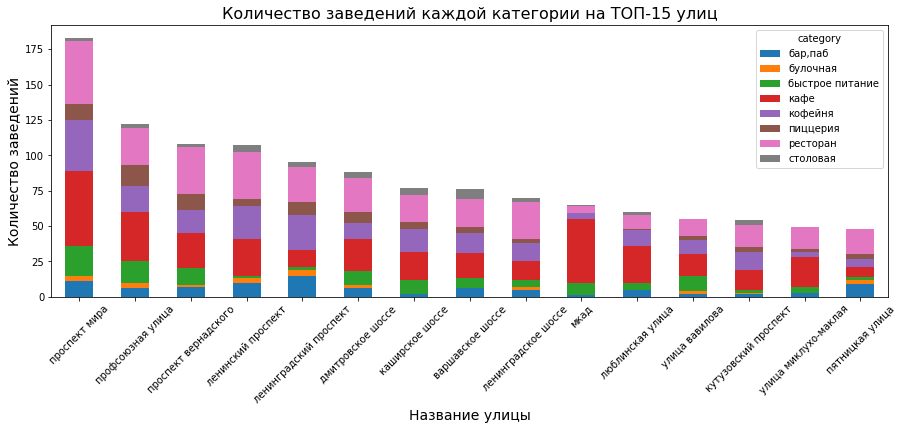

In [30]:
# Создадим сводную таблицу с группировкой по улицам и расчетом на каждой улице заведений в разрезе категорий
data_street=data.pivot_table(
        index='street',
        columns ='category',
        values='name',
        aggfunc='count',
    )
data_street['total'] = data_street.sum(axis=1)# создаем столбец с общим количеством заведений на каждой улице для сортировки
# затем его удалим, т.к. для построения графика он не нужен
data_street.sort_values(by='total', ascending = False).drop('total', axis=1)[0:15]\
                        .plot(kind = 'bar', stacked = True, figsize=(15, 5))

plt.title('Количество заведений каждой категории на ТОП-15 улиц', size = 16)
plt.ylabel('Количество заведений', size = 14)
plt.xlabel('Название улицы', size = 14)
plt.xticks(rotation=45)
plt.show()

**На проспекте Мира больше всего заведений общественного питания Москвы, где чаще встречаются кафе, рестораны и кофейни.**

Найдем улицы, на которых находится только один объект общепита. Проанализируем эти объекты

In [31]:
# Выделим улицы, на которых находится только одно заведение
one_per_street = data.pivot_table(index = 'street', values='name', aggfunc = 'count')\
                .reset_index().query('name == 1')

In [32]:
# Выведем на карте все заведения, которые являются единственными на улице

m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m2)

data[data['street'].isin(one_per_street['street'])].apply(create_clusters, axis=1)
# выводим карту
m2

**При детальном анализае видно, что улицы, на которых располагается только одно заведение либо очень короткие, либо находятся на окраинах Москвы.**

Анализ средних чеков

Значения средних чеков заведений хранятся в столбце `middle_avg_bill`. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района.

Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. 

Проанализируем цены в центральном административном округе и других и оценим влияние удалённости от центра на цены в заведениях.

In [33]:
# создадим датафрейм, сгруппируем данные по округам где посчитаем медиану среднего чека 
district_avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')\
                                 .sort_values(by = 'middle_avg_bill', ascending = False)
district_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [34]:
# построим график, где видно размер среднего чека по округам

fig = px.bar(district_avg_bill.reset_index(), x = 'district',\
                                        y = 'middle_avg_bill',\
                                        title='Средний чек по округам',\
                                        text = 'middle_avg_bill',\
                                        labels = {'middle_avg_bill': 'Средний чек', 'district': 'Округ'})
fig.show()

In [35]:
# Нанесем данные на хороплет
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.5,
    legend_name='Медианный средний чек заведений',
).add_to(m)

# выводим карту
m

**Самые высокие цены по заведениям общественного питания в центральном и западном округах. Ниже цены идут в северо-западном, северном, юго-западном и восточном округах. Самый низкий диапазон цен в южном, северо-восточном и юго-восточном округах.В целом можно сделать вывод, что средний чек зависит от удаленности от центра, исключением является западный округ.**

**Общие выводы по анализу данных:**
- Наибольшее количество объектов относятся к категориям кафе, рестораны и кофейни. Меньше всего столовых и булочных.
- Большинство заведений имеет количество посадочных мест до 100.
- Доля сетевых заведений (38%) значительно меньше(в 1.6 раза), чем несетевых (62%).
- Количество несетевых кафе, ресторанов, баров(пабов), заведений быстрого питания и столовых значительно больше, чем сетевых. Количество сетевых кофеен и пиццерий сопоставимо с количеством несетевых заведений аналогичных типов. Единственным сегментом, где сетевых предприятий больше являются булочные.
- Лидерами среди популярных сетей Москвы является кофейни и пиццерии. Наибольшую сеть имеет Шоколадница.
- Более всего во всех округах Москвы встречаются кафе, рестораны и кофейни.
- Больше всего заведений общественного питания распологается в самом центре Москвы - Центральном административном округе.
- Средние рейтинги по категориям заведений отличаются не сильно и колеблются от 4 до 4.4. Наивысший рейтинг имеют бар-пабы. Рейтинг основной части категорий находится в диапазоне 4.2 - 4.3. Рейтинг заведений быстрого питания ниже всех - 4.05.
- Улицей с наибольшим количеством объектов общепита является проспект Мира, на нем чаще встречаются кафе, рестораны и кофейни.
- Улицы, на которых располагается только одно заведение либо очень короткие, либо находятся на окраинах Москвы.
- Самые высокие цены по заведениям общественного питания в центральном и западном округах. Средний чек зависит от удаленности от центра, исключением является западный округ, где уровень цен сопоставимый.


### 4. Детализация исследования: открытие кофейни <a id="cell4"></a>  <font size = 2>[к оглавлению](#cell0)</font>

Проведем отдельный анализ по категории кофеен, которую намериваются открыть инвесторы. И выработаем предварительные рекомендации.

Определим общее количество кофеен в датасете, в каких районах их больше всего и каковы особенности их расположения.

In [36]:
print('Всего в датасете представлено ', data.query('category =="кофейня"')['category'].count(), 'кофеен')


Всего в датасете представлено  1413 кофеен


In [37]:
# Создадим датафрейм, где оставим информацию только по кофейням
data_coffe = data.query('category =="кофейня"')
# сгруппируем данные по округам по количеству кофеен и построим график распределения кофеен по округам
fig = px.bar(data_coffe.groupby(by = 'district')['category']\
        .count()\
        .reset_index()\
        .sort_values('category', ascending = False),\
                        x = 'district',\
                        y = 'category',\
                        title='Количество кофеен по округам',\
                        text = 'category',\
                        labels = {'category': 'Количество кофеен', 'district': 'Округ'})
fig.show()

Посмотрим расположение кофеен на карте

In [38]:
# Выведем на карте все кофейни

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

data_coffe.apply(create_clusters, axis=1)

m

**В центральном округе существенно превышает количество кофеен над количеством в остальных округах (более чем в 2 раза), при этом кофейни в основном расположены в местах с высокой проходимостью.**

In [39]:
# Определим долю круглосуточных кофеен
fig = go.Figure(data=[go.Pie(labels=['Не круглосуточная', 'Круглосуточная'],\
                             values=[data_coffe.query('is_24_7 == False')['name'].count(),\
                                     data_coffe.query('is_24_7 == True')['name'].count()])])
fig.update_layout(title = 'Доля круглосуточных кoфеен')
fig.show() 

**Доля круглосуточных кoфеен крайне мала, всего 4 %**

Посмотрим распределение рейтингов кофеен по районам

In [40]:
fig = px.bar(data_coffe.groupby('district', as_index = False)[['rating']].mean().round(2).\
                        sort_values(by = ['rating']),\
                        x = 'rating',\
                        y = 'district',\
                        title='Средний рейтинг кофеен по районам',\
                        text = 'rating',\
                        labels = {'rating': 'Рейтинг', 'district': 'Район'})
fig.show()

**Абсолютная разница в рейтингах минимальна. Наибольший рейтинг у кофеен в Центральном и Северо-западном округах, наименьший в Западном.**

Определим на какую стоимость чашки капучино стоит ориентироваться при открытии.

In [41]:
# посчитаем медиану стоимости чашки капучино в кофейнях
data_coffe['middle_coffee_cup'].median()

170.0

In [42]:
# Сгруппируем по округам и построим медианное распределение стоимости чашки капучино по округам
fig = px.bar(data_coffe.groupby(by = 'district')['middle_coffee_cup']\
        .median().round(0)\
        .reset_index()\
        .sort_values('middle_coffee_cup', ascending = False),\
                        x = 'district',\
                        y = 'middle_coffee_cup',\
                        title='Медианная стоимость чашки капучино по округам',\
                        text = 'middle_coffee_cup',\
                        labels = {'middle_coffee_cup': 'Медианная стоимость чашки капучино', 'district': 'Округ'})
fig.show()

**В Юго-западном, Центральном и Западном округах самая дорогая стоимость чашки капучино. В целом медианная стоимость чашки 170 руб.**

**Общие рекомендации по открытию кофейни для инвесторов:**
Хорошим вариантом будет открытие кофейни в Западном округе Москвы на основании следующих наблюдений:
- Общий средний чек и стоимость чашки кофе на уровне центрального округа.
- В сравнении с центральным округом более низкая концентрация кофеен, а также самый низкий рейтинг кофеен из всех округов. При открытии кофейни и соблюдении высоких стандартов возможно стать "той самой кофейней из сериала Friends".
- Следует рассмотреть возможность открытия сети кофеен, что позволит снизить издержки и повысит узнаваемость бренда.
- При открытии можно ориентироваться на медианную стоимость чашки кофе в Западном округе в размере 189 руб.

## 5. Презентация для инвесторов сохранена в папке с тетрадкой <a id="cell5"></a> <font size = 2>[к оглавлению](#cell0)</font>